In [1]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import ast

from lib.functions_data import *

In [2]:
import sys
from pathlib import Path
import os
cwd = os.getcwd()
parent = str(Path(cwd).parents[0])
sys.path.append(parent)

%matplotlib inline
%load_ext autoreload
%autoreload 2

To avoid pulling the full dataset down each time we re-run the notebook, a CSV of the cut-down dataset is saved for easier reloading.

In [3]:
#Checking for the cut of the full dataset and creating it if it doesn't exist:
try:
    dec = pd.read_csv(parent + '/data/dec_euctr_extract.csv').drop('Unnamed: 0', axis=1)
except FileNotFoundError:
    cols = ['eudract_number_with_country', 'date_of_competent_authority_decision', 
            'clinical_trial_type', 'national_competent_authority', 'eudract_number',
            'date_on_which_this_record_was_first_entered_in_the_eudract_data',
            'trial_status', 'date_of_the_global_end_of_the_trial', 'trial_results']

    #You can use this URL if you want to download the full raw data
    data_link = 'https://www.dropbox.com/s/4qt0msiipyn7crm/euctr_euctr_dump-2020-12-03-095517.csv.zip?dl=1'

    dec = pd.read_csv(data_link, compression='zip', low_memory=False, usecols=cols)
    dec.to_csv(parent + '/data/dec_euctr_extract.csv')

#This is additional data we collect from the results page we need for certain analyses
results_info = pd.read_csv(parent + '/data/euctr_data_quality_results_scrape_dec_2020.csv')
results_info['trial_start_date'] = pd.to_datetime(results_info.trial_start_date)

In [4]:
#Quick look at the spread of trial statuses on the EUCTR
dec.trial_status.value_counts(dropna=False)

Completed             52035
Ongoing               31573
Prematurely Ended     11399
NaN                    2586
Temporarily Halted      498
Restarted               398
Not Authorised           73
Prohibited by CA         38
Suspended by CA          22
Name: trial_status, dtype: int64

The "date_of_competent_authority_decision" field has 2 nonsensical year values in which the correct value can reasonably be derived from context. We fix those below:

https://www.clinicaltrialsregister.eu/ctr-search/trial/2009-016759-22/DK

https://www.clinicaltrialsregister.eu/ctr-search/trial/2006-006947-30/FR

In [5]:
ind = dec[dec.date_of_competent_authority_decision.notnull() & 
          dec.date_of_competent_authority_decision.str.contains('210')].index
ind = ind.to_list()[0]

ind_2 = dec[dec.date_of_competent_authority_decision.notnull() & 
            dec.date_of_competent_authority_decision.str.contains('2077')].index
ind_2 = ind_2.to_list()[0]

dec.at[ind, 'date_of_competent_authority_decision'] = '2010-06-18'
dec.at[ind_2, 'date_of_competent_authority_decision'] = '2007-04-05'

In [6]:
#get rid of all protocols from non EU/EEA countries
dec_filt = dec[dec.clinical_trial_type != 'Outside EU/EEA'].reset_index(drop=True)

#lets see how many that is:
print(len(dec) - len(dec_filt))

1395


In [7]:
dec_ctas = dec[['eudract_number', 'eudract_number_with_country']].groupby('eudract_number').count()['eudract_number_with_country']

print(f'There are {len(dec_ctas)} registered trials and {dec_ctas.sum()} CTAs including non-EU/EEA CTAs')

There are 38566 registered trials and 98622 CTAs including non-EU/EEA CTAs


In [8]:
decf_ctas = dec_filt[['eudract_number', 'eudract_number_with_country']].groupby('eudract_number').count()['eudract_number_with_country']

print(f'There are {len(decf_ctas)} registered trials and {decf_ctas.sum()} CTAs excluding non-EU/EEA CTAs')

There are 37520 registered trials and 97227 CTAs excluding non-EU/EEA CTAs


In [9]:
#Making dates into dates and adding a column of just the "Year" for relevant dates

dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'] = pd.to_datetime(dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'])
dec_filt['entered_year'] = dec_filt['date_on_which_this_record_was_first_entered_in_the_eudract_data'].dt.year

dec_filt['date_of_competent_authority_decision'] = pd.to_datetime(dec_filt['date_of_competent_authority_decision'])
dec_filt['approved_year'] = dec_filt['date_of_competent_authority_decision'].dt.year

In [10]:
#Creating a copy of the original dataset we can mess with and
#renaming columns to better variable names

analysis_df = dec_filt.copy()
analysis_df.columns = ['eudract_number_country', 
                       'approved_date', 
                       'clinical_trial_type', 
                       'nca', 
                       'eudract_number', 
                       'date_entered', 
                       'trial_status', 
                       'completion_date', 
                       'trial_results', 
                       'entered_year', 
                       'approved_year']

#And update the NCA names to the more accurate recent names

analysis_df['nca'] = analysis_df['nca'].replace(nca_name_mapping)

In [11]:
#Table 1
analysis_df[['nca', 'eudract_number_country']].groupby('nca').count()

,eudract_number_country
nca,
Austria - BASG,4146
Belgium - FAMHP,5846
Bulgaria - BDA,2007
Croatia - MIZ,401
Cyprus - MoH-Ph.S,5
Czech Republic - SUKL,4304
Denmark - DKMA,4069
Estonia - SAM,1020
Finland - FIMEA,2533


In [12]:
#You can reproduce the data on the earliest registered protocol for each country by running this cell
#with the appropriate country abbreviation. For example, to get the date for Italy:

print(earliest_record_check(analysis_df, 'Italy - AIFA'))

#Uncomment this to get the date for all countries at once
#for abrev in country_abrevs.keys():
#    print(f'Country: {abrev}\nEarliest record date: {earliest_record_check(dec_filt, abrev)}')

2004-07-16


In [13]:
#lastly this is helpful to have the country names in various orders
ordered_countries_original = list(dec_filt.national_competent_authority.value_counts().index)
ordered_countries_new = list(analysis_df.nca.value_counts().index)

# Registrations Over Time

In [14]:
reg_df = analysis_df[['eudract_number', 'nca', 'date_entered', 'entered_year', 'approved_date', 'approved_year']].reset_index(drop=True)
reg_df.head()

,eudract_number,nca,date_entered,entered_year,approved_date,approved_year
0,2019-000796-16,Czech Republic - SUKL,2020-03-17,2020,2020-05-06,2020.0
1,2008-000679-90,Belgium - FAMHP,2008-06-18,2008,2008-07-29,2008.0
2,2010-022818-19,Ireland - HPRA,2011-02-15,2011,2011-04-08,2011.0
3,2008-000679-90,Germany - BfArM,2008-05-20,2008,2008-08-20,2008.0
4,2016-000541-31,Belgium - FAMHP,2016-10-18,2016,2016-10-25,2016.0


In [15]:
#Data for Overall Trend in Registrations

grouped_overall = reg_df[['eudract_number']].groupby([reg_df.entered_year]).count()
earliest_entered = reg_df[['eudract_number', 'date_entered']].groupby('eudract_number', as_index=False).min()
earliest_entered['year'] = earliest_entered.date_entered.dt.year
unique_trials = earliest_entered[['eudract_number', 'year']].groupby('year').count()

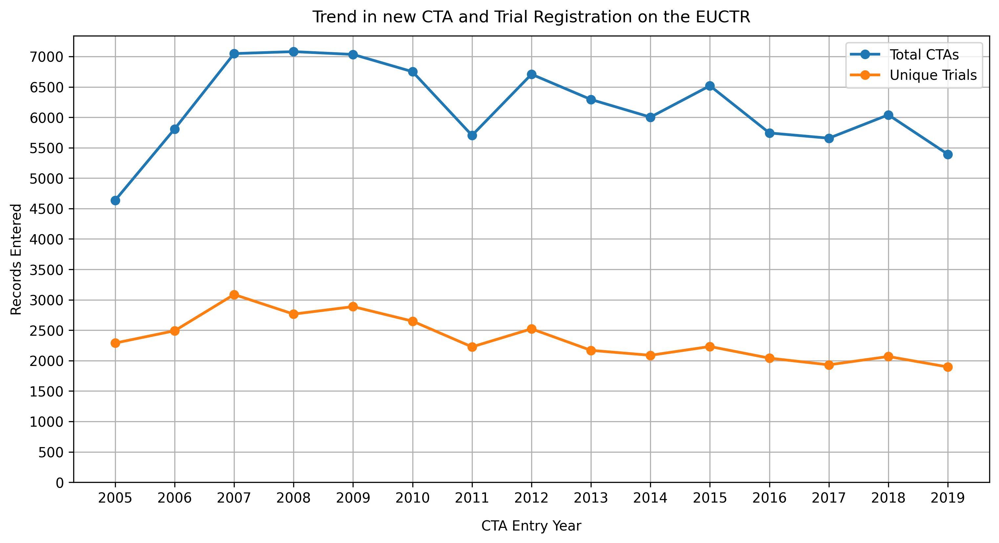

In [16]:
fig, ax = plt.subplots(figsize = (12,6), dpi=300)

grouped_overall[(grouped_overall.index > 2004) & (grouped_overall.index < 2020)].plot(ax=ax, legend=False, lw=2, 
                                                                                      marker='.', markersize=12)
unique_trials[(unique_trials.index > 2004) & (unique_trials.index < 2020)].plot(ax=ax, legend=False, grid=True, 
                                                                                lw=2, marker='.', markersize=12)

ax.legend(['Total CTAs', 'Unique Trials'], bbox_to_anchor = (1, 1))
ax.set_xticks(range(2005, 2020))
ax.set_yticks(range(0,7500, 500))
plt.xlabel('CTA Entry Year', labelpad=10)
plt.ylabel('Records Entered')
plt.title('Trend in new CTA and Trial Registration on the EUCTR', pad=10)

#fig.savefig(parent + '/data/Figures/fig1.jpg', bbox_inches='tight', dpi=300)
fig.show()

Now we're interested in breaking the data down a bit further. Here we will break it down into quarters and years for more detailed analysis. We graph the years for which we have full EUCTR data (2005-2019).

In [17]:
grouped = reg_df[['eudract_number']].groupby([reg_df.nca, pd.PeriodIndex(reg_df.date_entered, freq='Q')]).count()

get_index = reg_df[['eudract_number']].groupby(pd.PeriodIndex(reg_df.date_entered, freq='Q')).count()
quarters = list(get_index.index)

In [18]:
grouped_2 = reg_df[['eudract_number']].groupby([reg_df.nca, pd.PeriodIndex(reg_df.date_entered, freq='Y')]).count()

get_index = reg_df[['eudract_number']].groupby(pd.PeriodIndex(reg_df.date_entered, freq='Y')).count()
years = list(get_index.index)

In [19]:
grouped_year = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.entered_year]).count()
grouped_year_2 = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.approved_year]).count()

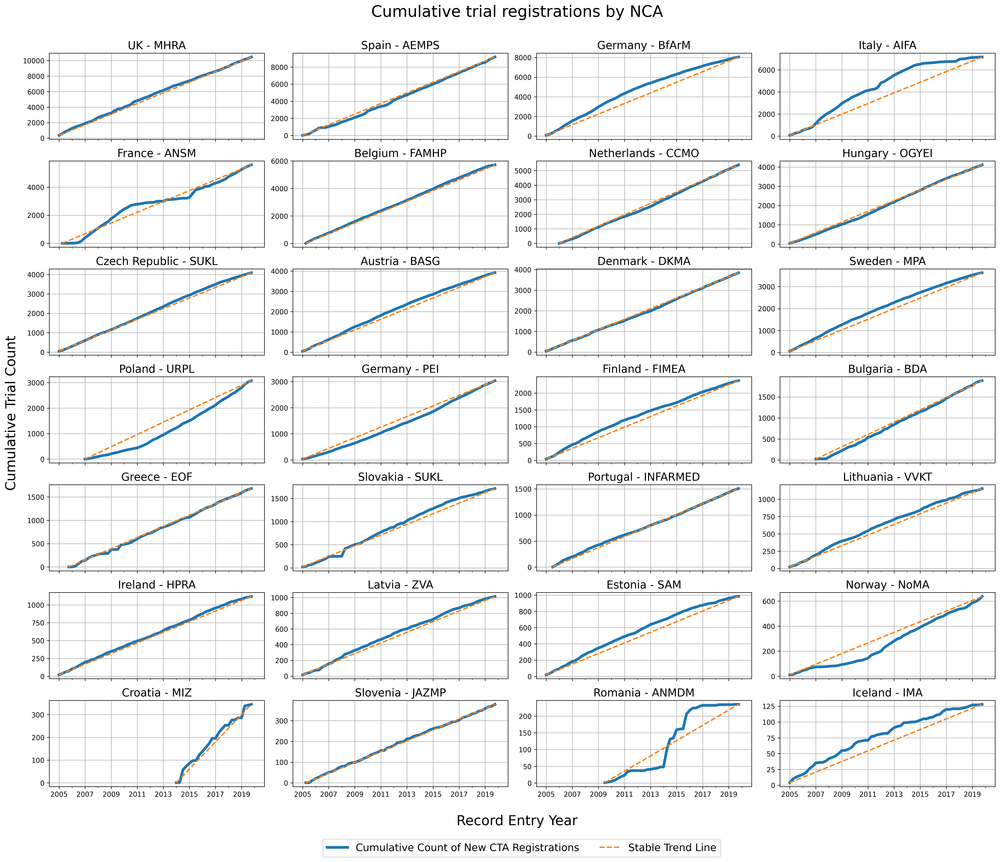

In [20]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Cumulative trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], quarters) 
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index.year > 2004) & (data.index.year < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    cumulative = consolidated.cumsum()
    
    # Plotting the country trend
    cumulative.plot(ax=y, lw=4, sharex='col',legend=False)
    
    #Plotting the reference line
    cumulative.loc[[cumulative.index[0], cumulative.index[-1]]].plot(ax=y, legend=False, lw=2, style='--')
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Cumulative Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['Cumulative Count of New CTA Registrations', 'Stable Trend Line'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.55), fontsize=15)
plt.show()
#fig.savefig(parent + '/data/Figures/fig2.jpg', bbox_inches='tight', dpi=300)

For comparison here are the raw trends in new registrations by quarter

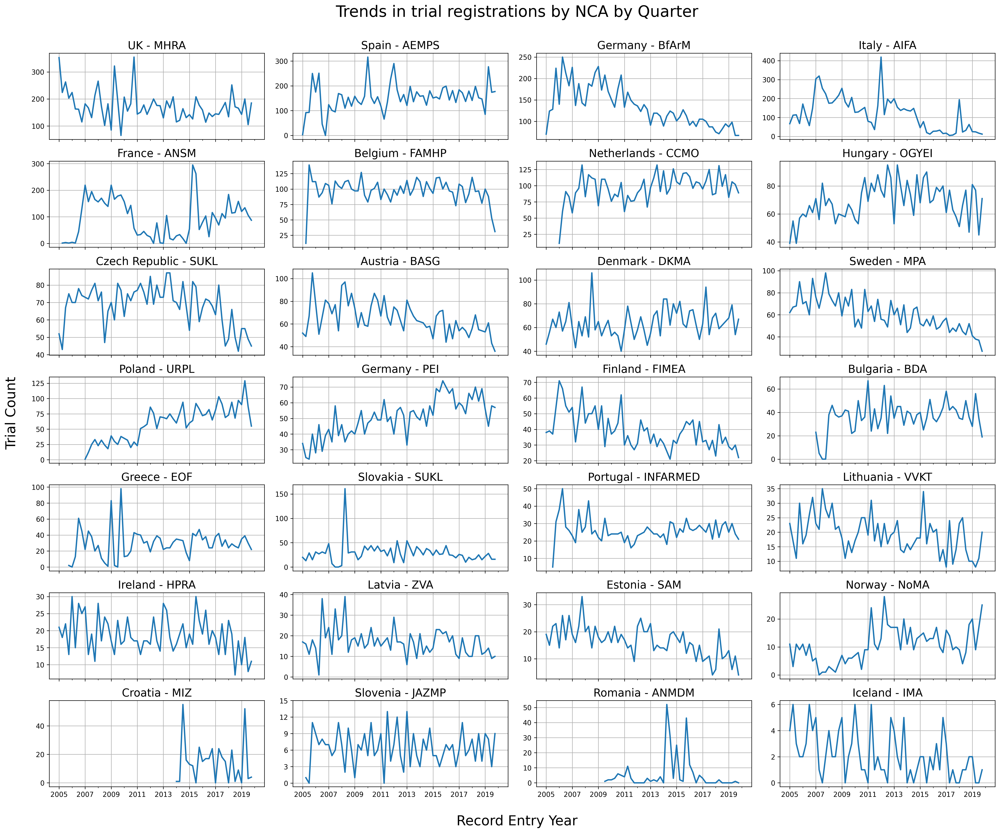

In [21]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA by Quarter", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], quarters) 
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index.year > 2004) & (data.index.year < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    
    if ordered_countries_original[x] == 'Slovenia - JAZMP':
        y.set_yticks(range(0,16,3))
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/sfig1.jpg', bbox_inches='tight', dpi=300)

Lasty, we can sense check that these dates make sense by comparing the year the CTA was entered to the date the NCA gave approval. When we graph them on top of each other, we can see that the overall trend align very well though with approvals being slightly less susceptable to large jumps.

In [22]:
grouped_year = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.entered_year]).count()
grouped_year_2 = reg_df[['eudract_number']].groupby([reg_df.nca, reg_df.approved_year]).count()

Here is the trend by year, not quarter, but we do not include this graph in the paper as it is duplicated in the next graph.

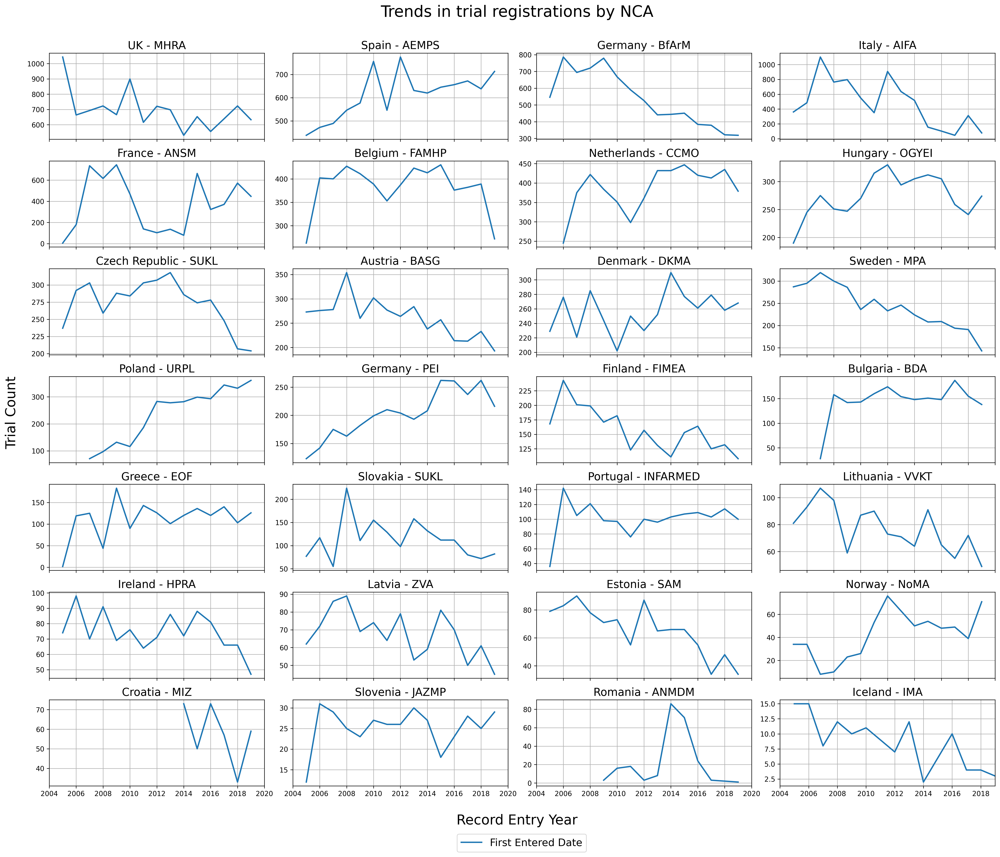

In [23]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped_year.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], range(2004, 2020))
    
    data = pd.DataFrame({'eudract_number': adjusted_data})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    
    consolidated = data[(data.index > 2004) & (data.index < 2020) & data.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number.values[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])
    
pd.set_option('mode.chained_assignment', 'warn')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['First Entered Date', 'NCA Approval Date'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.5), fontsize=15)
plt.show()

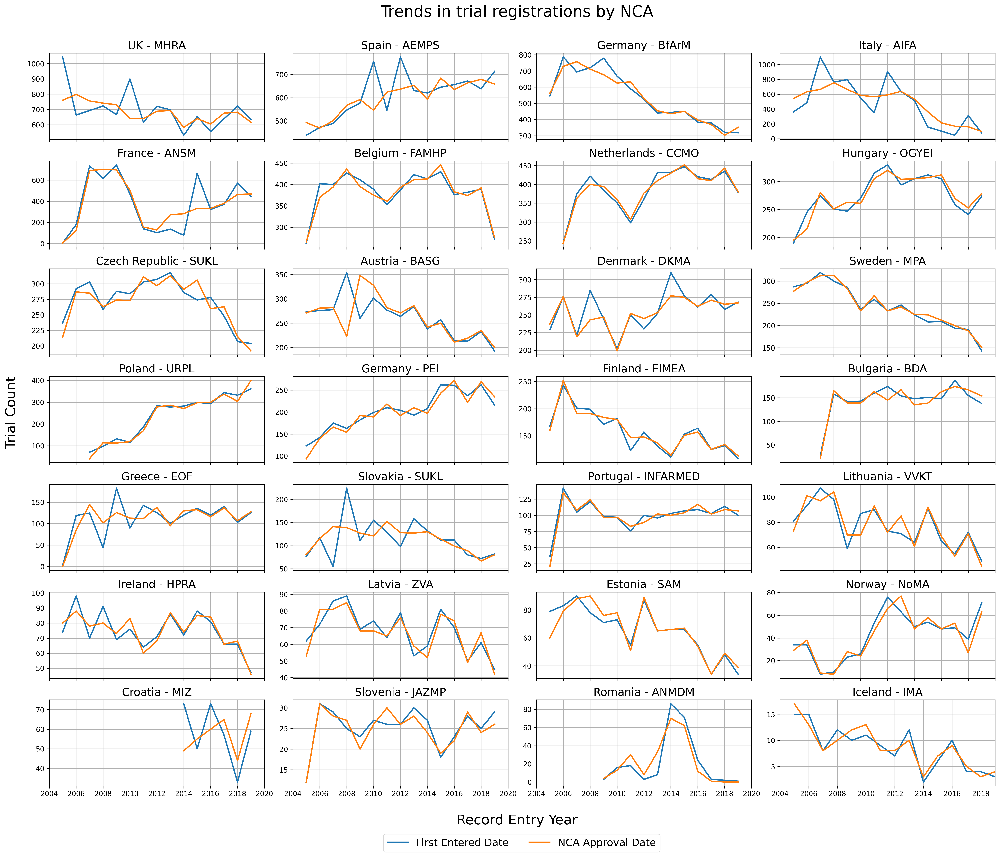

In [24]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trends in trial registrations by NCA", y=1.02, fontsize=23)
fig.tight_layout()

pd.set_option('mode.chained_assignment', None)
for x, y in enumerate(fig.axes):
    country = grouped_year.loc[ordered_countries_new[x]]
    country_2 = grouped_year_2.loc[ordered_countries_new[x]]
    first_reporting_quarter = country[country.eudract_number > 0].index.min()
    
    adjusted_data = zero_out_dict(country.to_dict()['eudract_number'], range(2004, 2020))
    adjusted_data_2 = zero_out_dict(country_2.to_dict()['eudract_number'], range(2004, 2020))
    
    data = pd.DataFrame({'eudract_number': adjusted_data})
    data_2 = pd.DataFrame({'eudract_number': adjusted_data_2})
    x_ticks = data.index
    
    #Get rid of leading zeros
    data['eudract_number'] = np.where(data.index < first_reporting_quarter, np.nan, data.eudract_number)
    data_2['eudract_number'] = np.where(data_2.index < first_reporting_quarter, np.nan, data_2.eudract_number)
    
    consolidated = data[(data.index > 2004) & (data.index < 2020) & data.eudract_number.notnull()]
    consolidated_2 = data_2[(data_2.index > 2004) & (data_2.index < 2020) & data_2.eudract_number.notnull()]
    
    leading_zero_check = True
    i=0
    
    while leading_zero_check:
        if consolidated.eudract_number.values[i] == 0:
            consolidated.at[consolidated.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    while leading_zero_check:
        if consolidated_2.eudract_number.values[i] == 0:
            consolidated_2.at[consolidated_2.index[i], 'eudract_number'] = np.nan
            i+=1
        else:
            leading_zero_check = False
    
    consolidated = consolidated[consolidated.eudract_number.notnull()]
    consolidated_2 = consolidated_2[consolidated_2.eudract_number.notnull()]
    
    consolidated.plot(ax=y, lw=2, sharex='col',legend=False)
    consolidated_2.plot(ax=y, lw=2, sharex='col',legend=False)
    
    y.set_title(ordered_countries_new[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(zorder=0)
    y.set_xlabel('')
    y.set_xlim(x_ticks[0], x_ticks[-1])

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)
    
pd.set_option('mode.chained_assignment', 'warn')
plt.legend(['First Entered Date', 'NCA Approval Date'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.5), fontsize=15)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig2.jpg', bbox_inches='tight', dpi=300)

# Cross-checking countries listed in results with public CTAs

In [25]:
results_info_filt = results_info[results_info.recruitment_countries.notnull()].reset_index(drop=True)

In [26]:
protocols = results_info_filt.trial_countries.to_list()
results_countries = results_info_filt.recruitment_countries.to_list()
start_date = results_info_filt.trial_start_date.to_list()
trial_ids = results_info_filt.trial_id.to_list()

zipped_cats = zip(trial_ids, protocols, results_countries, start_date)

results_list = compare_enrollment_registration(zipped_cats)

missing_protocols = pd.DataFrame(results_list)
missing_protocols['total_missing'] = missing_protocols.unaccounted.apply(len)

In [27]:
acct = missing_protocols.accounted.to_list()
unacct = missing_protocols.unaccounted.to_list()

In [28]:
accounted_count = {}
unaccounted_count = {}
for ac, un in zip(acct, unacct):
    if ac:
        for a in ac:
            accounted_count[a] = accounted_count.get(a, 0) + 1
    if un:
        for u in un:
            unaccounted_count[u] = unaccounted_count.get(u, 0) + 1

In [29]:
accounted_series = pd.Series(accounted_count)
unaccounted_series = pd.Series(unaccounted_count)

reg_check_no_buffer = accounted_series.to_frame().join(unaccounted_series.to_frame(), how='outer', rsuffix='unac').rename({'0': 'accounted', '0unac': 'unaccounted'}, axis=1).fillna(0)

In [33]:
reg_check_no_buffer['total'] = reg_check_no_buffer['accounted'] + reg_check_no_buffer['unaccounted']

reg_check_no_buffer['acct_prct'] = round((reg_check_no_buffer['accounted'] / reg_check_no_buffer['total']) * 100, 2)

reg_check_no_buffer['unacct_prct'] = round((reg_check_no_buffer['unaccounted'] / reg_check_no_buffer['total']) * 100, 2)

reg_check_no_buffer.head()

,accounted,unaccounted,total,acct_prct,unacct_prct
Austria,1012.0,11.0,1023.0,98.92,1.08
Belgium,1718.0,46.0,1764.0,97.39,2.61
Bulgaria,797.0,67.0,864.0,92.25,7.75
Croatia,101.0,0.0,101.0,100.00,0.00
Cyprus,0.0,6.0,6.0,0.00,100.00


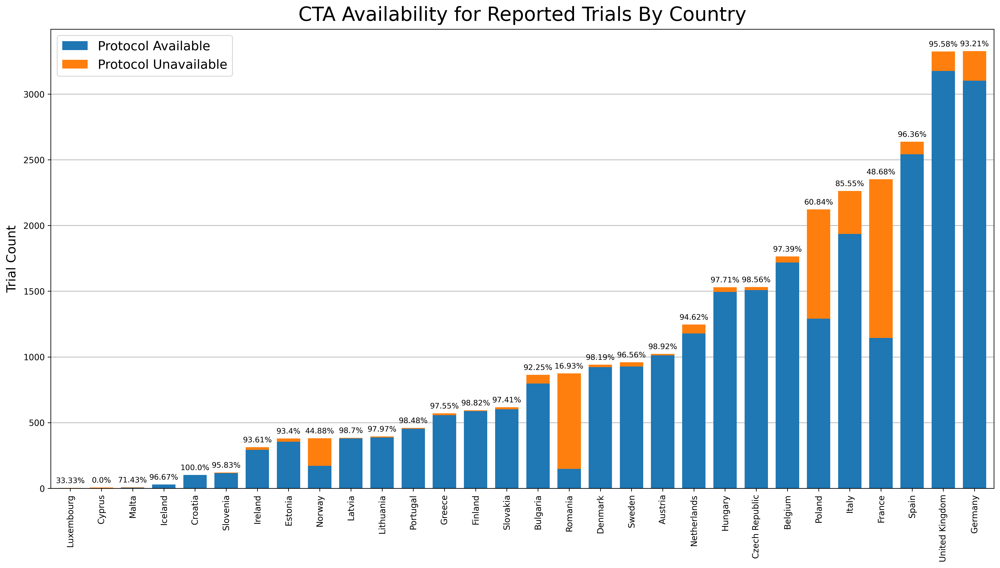

In [34]:
fig, ax = plt.subplots(figsize = (20,10), dpi=300)

title = 'CTA Availability for Reported Trials By Country'

sorted_countries = reg_check_no_buffer.sort_values(by='total')
sorted_countries[['accounted', 'unaccounted']].plot.bar(stacked=True, ax=ax,
                                                        legend=False, width=.75)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)

rects = ax.patches[0:30]

for rect, label, y_off in zip(rects, sorted_countries.acct_prct.values, sorted_countries.total.values):
    ax.text(rect.get_x() + rect.get_width() / 2, y_off + 25, str(label) + '%', 
            ha='center', va='bottom', fontsize=9)

ax.legend(['Protocol Available', 'Protocol Unavailable'], 
           loc='upper left', fontsize=15)
    

plt.title(title, pad=10, fontsize=23)

plt.ylabel('Trial Count', fontsize=15, labelpad=6)
    
plt.show()
#fig.savefig(parent + '/data/Figures/fig3.jpg', bbox_inches='tight', dpi=300)

In [35]:
min_start_date = analysis_df[['eudract_number', 'entered_year']].groupby('eudract_number', as_index=False).min()

by_year_df = missing_protocols.merge(min_start_date, how='left', left_on='trial_id', right_on='eudract_number').drop('eudract_number', axis=1)

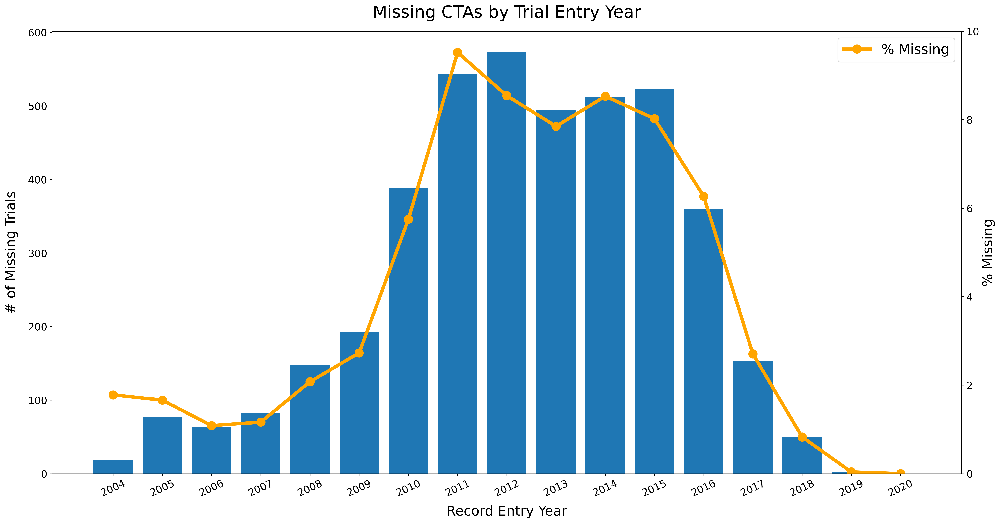

In [36]:
fig, ax = plt.subplots(figsize=(24,12), dpi = 300)

to_graph = by_year_df[['entered_year', 'total_missing']].groupby('entered_year').sum()
to_graph.index = to_graph.index.astype(int)

prct_missing = grouped_overall.join(to_graph)
prct_missing['missing_cta_prct'] = (prct_missing.total_missing / prct_missing.eudract_number) * 100

labels = [str(x) for x in range(2004,2021)]

#I have no idea why but I can only get this graph to work with plt.errorbar
#l1 = plt.errorbar(prct_missing.index,prct_missing.missing_cta_prct, lw=5, color='orange')
l1 = ax.plot(prct_missing.index,prct_missing.missing_cta_prct, marker='.', markersize=25, lw=5, color='orange', label='% Missing')

plt.tick_params(axis='both', which='major', labelsize=15)
#plt.ylabel('# of Missing Trials', fontsize=25, labelpad=10)
plt.xticks(rotation=25)
plt.title("Missing CTAs by Trial Entry Year", pad = 20, fontsize = 25)

ax.set_ylim([0,10])
ax.set_ylabel('# of Missing Trials', fontsize=20, labelpad=50)
ax.set_xlabel('Record Entry Year', fontsize=20, labelpad=10)

ax2 = plt.twinx()
ax2.set_axisbelow(True)
#ax.yaxis.grid(linestyle='--', linewidth=.5, zorder=ax.get_zorder()-10)
ax2.bar(to_graph.index, to_graph.total_missing, tick_label=labels)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2.set_ylabel('% Missing', fontsize=20, labelpad=30)

ax.yaxis.tick_right()
ax2.yaxis.tick_left()

ax.set_zorder(ax2.get_zorder()+1)
ax.patch.set_visible(False)

ax.legend(fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/fig4.jpg', bbox_inches='tight', dpi=300)

As a quick sense check, we can use longer lags between the first available protocol for a country to see if it makes a difference. This can be adjusted using the offseet parameter of the compare_enrollment_registration function. However, Figure 4 above makes the point that missing CTAs are not all clustered around the years in which countries first connected with the EMA system as well.

In [37]:
protocols = results_info_filt.trial_countries.to_list()
results_countries = results_info_filt.recruitment_countries.to_list()
start_date = results_info_filt.trial_start_date.to_list()
trial_ids = results_info_filt.trial_id.to_list()

zipped_cats = zip(trial_ids, protocols, results_countries, start_date)

results_sens = compare_enrollment_registration(zipped_cats, offset=6)

missing_sensitivity = pd.DataFrame(results_sens)

In [38]:
acct_sens = missing_sensitivity.accounted.to_list()
unacct_sens = missing_sensitivity.unaccounted.to_list()

accounted_count_sens = {}
unaccounted_count_sens = {}
for ac, un in zip(acct_sens, unacct_sens):
    if ac:
        for a in ac:
            accounted_count_sens[a] = accounted_count_sens.get(a, 0) + 1
    if un:
        for u in un:
            unaccounted_count_sens[u] = unaccounted_count_sens.get(u, 0) + 1
            
accounted_series_sens = pd.Series(accounted_count_sens)
unaccounted_series_sens = pd.Series(unaccounted_count_sens)

In [39]:
reg_check_buffer = accounted_series_sens.to_frame().join(unaccounted_series_sens.to_frame(), how='outer', rsuffix='unac').rename({'0': 'accounted', '0unac': 'unaccounted'}, axis=1).fillna(0)

reg_check_buffer['total'] = reg_check_buffer['accounted'] + reg_check_buffer['unaccounted']
reg_check_buffer['acct_prct'] = round((reg_check_buffer['accounted'] / reg_check_buffer['total']) * 100, 2)

reg_check_buffer.head()

,accounted,unaccounted,total,acct_prct
Austria,1004.0,10.0,1014.0,99.01
Belgium,1708.0,39.0,1747.0,97.77
Bulgaria,793.0,66.0,859.0,92.32
Croatia,88.0,0.0,88.0,100.00
Cyprus,0.0,6.0,6.0,0.00


# Trial Status By Country Over Time

In [40]:
status_df = analysis_df[['eudract_number', 'nca', 'entered_year', 'trial_status']].reset_index(drop=True)
status_df['trial_status'] = status_df.trial_status.fillna('Missing')

status_group = status_df.groupby(['nca', 'entered_year', 'trial_status'], as_index=False).count()

In [41]:
ordered_countries = list(status_group[['nca', 'eudract_number']].groupby('nca').sum().sort_values(by='eudract_number', ascending=False).index)

#Removing these for low number of trials
ordered_countries.remove('Malta - ADM')
ordered_countries.remove('Luxembourg - Ministry of Health')
ordered_countries.remove('Cyprus - MoH-Ph.S')

Here we create our trial status categories

In [42]:
country_status = {}

for c in status_group.nca.unique():
    country_dict = {}
    country = status_group[status_group.nca == c]
    
    completed = country[country.trial_status.isin(['Completed', 'Prematurely Ended'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    comp_dict = completed.to_dict()['eudract_number']
    country_dict['completed'] = zero_out_dict(comp_dict, range(2004,2021))
    
    ongoing = country[country.trial_status.isin(['Ongoing', 'Restarted'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    ong_dict = ongoing.to_dict()['eudract_number']
    country_dict['ongoing'] = zero_out_dict(ong_dict, range(2004,2021))
    
    missing = country[country.trial_status == 'Missing']
    missing_dict = pd.Series(missing.eudract_number.values, index=missing.entered_year).to_dict()
    country_dict['missing'] = zero_out_dict(missing_dict, range(2004,2021))
    
    other = country[~country.trial_status.isin(['Completed', 'Ongoing', 'Restarted', 'Prematurely Ended', 'Missing'])][['entered_year', 'eudract_number']].groupby('entered_year').sum()
    other_dict = other.to_dict()['eudract_number']
    country_dict['other'] = zero_out_dict(other_dict, range(2004,2021))
    
    country_status[c] = country_dict

In [43]:
#Shaping up the final data so it's easy to use

regrouped = pd.DataFrame.from_dict(country_status, orient='index').stack().to_frame()[0].apply(pd.Series).reindex(
    ['completed', 'ongoing', 'other', 'missing'], level=1)

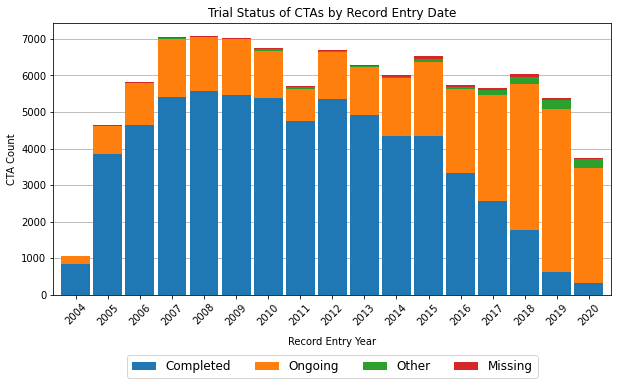

In [44]:
#A glance at the overall trend

grouped_total = regrouped.droplevel(level=0).groupby(regrouped.droplevel(level=0).index).sum()

title='Trial Status of CTAs by Record Entry Date'


fig, ax = plt.subplots(figsize = (10,5))
grouped_total.reindex(['completed', 'ongoing', 'missing', 'other']).T.plot.bar(stacked=True, width=.9, ax=ax, 
                                                                               rot=45, title = title, legend=False)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)
ax.set_xlabel('Record Entry Year', labelpad=10)
ax.set_ylabel('CTA Count')

plt.legend(['Completed', 'Ongoing', 'Other', 'Missing'], 
           loc='upper center', ncol=5, bbox_to_anchor = (0.5, -0.2), fontsize=12)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig3.jpg', bbox_inches='tight', dpi=300)

In [78]:
overall_prct_dict = {}

for x in ordered_countries:
    g = regrouped.loc[[x]].droplevel(level=0).T.loc[2004:2016]
    num = g.completed.sum()
    denom = num + g.ongoing.sum() + g.missing.sum() + g.other.sum()
    overall_prct_dict[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_completed = pd.Series(overall_prct_dict).sort_values(ascending=False)
#rankings_completed

UK - MHRA 7519 8464 0.8883506616257089 

Spain - AEMPS 3919 7264 0.5395099118942731 

Germany - BfArM 6265 7106 0.8816493104418801 

Italy - AIFA 4836 6758 0.7155963302752294 

France - ANSM 1528 4193 0.3644168852849988 

Belgium - FAMHP 3575 4676 0.7645423438836613 

Netherlands - CCMO 2353 4167 0.5646748260139189 

Hungary - OGYEI 2856 3468 0.8235294117647058 

Czech Republic - SUKL 3024 3528 0.8571428571428571 

Austria - BASG 2955 3387 0.8724534986713907 

Denmark - DKMA 2685 3095 0.8675282714054927 

Sweden - MPA 2518 3276 0.7686202686202687 

Poland - URPL 1728 2037 0.8483063328424153 

Germany - PEI 1974 2337 0.8446726572528883 

Finland - FIMEA 1628 2099 0.7756074321105288 

Bulgaria - BDA 1279 1406 0.9096728307254623 

Greece - EOF 1058 1309 0.8082505729564553 

Slovakia - SUKL 1336 1523 0.8772160210111621 

Portugal - INFARMED 984 1190 0.826890756302521 

Lithuania - VVKT 981 1027 0.9552093476144109 

Ireland - HPRA 780 969 0.804953560371517 

Latvia - ZVA 837 884 0.946832579

In [52]:
g.loc[2004:2015]

,completed,ongoing,other,missing
2004,5,0,0,0
2005,15,0,0,0
2006,13,2,0,0
2007,8,0,0,0
2008,12,0,0,0
2009,7,3,0,0
2010,9,2,0,0
2011,8,1,0,0
2012,7,0,0,0
2013,7,5,0,0


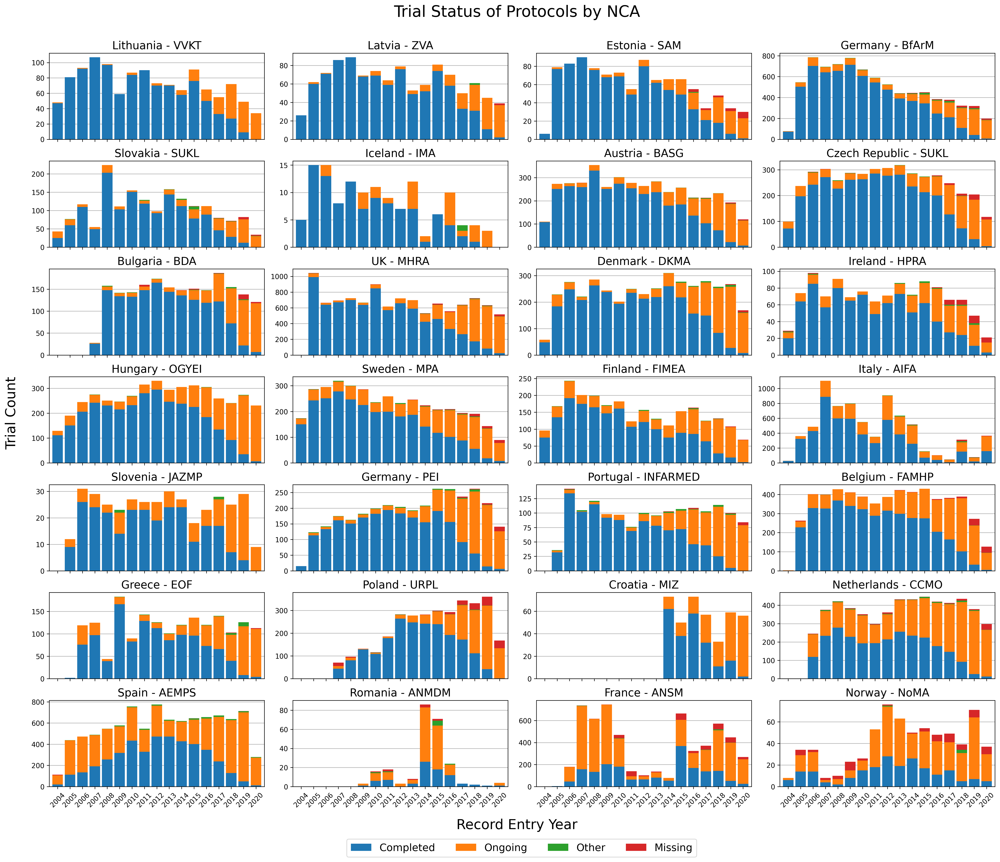

In [46]:
#And now a look at the trend for each NCA

fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4, dpi=300)
fig.suptitle("Trial Status of Protocols by NCA", y=1.02, fontsize=23)
fig.tight_layout()
for x, y in enumerate(fig.axes):
    regrouped.loc[[rankings_completed.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.85, 
                                                                               legend=False, sharex='col', rot=45)
    
    y.set_title(rankings_completed.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.025, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.legend(['Completed', 'Ongoing', 'Other', 'Missing'], 
           loc='upper center', ncol=5, bbox_to_anchor = (-1.2, -.55), fontsize=15)

plt.show()
#fig.savefig(parent + '/data/Figures/fig5.jpg', bbox_inches='tight', dpi=300)

# Missing Completion Dates

In [58]:
date_df = analysis_df[['eudract_number', 'nca', 'entered_year', 'trial_status', 'completion_date', 'trial_results']].reset_index(drop=True)
date_df['trial_status'] = date_df.trial_status.fillna('Missing')
date_df['has_completion_date'] = np.where(date_df.completion_date.isna(), 0, 1)

In [59]:
only_completed = date_df[date_df.trial_status.isin(['Completed', 'Prematurely Ended'])].reset_index(drop=True)

In [60]:
total_completed = only_completed[['nca', 
                                  'entered_year', 
                                  'has_completion_date']].groupby(['nca', 
                                                                   'entered_year']).count().rename({'has_completion_date': 'denominator'}, axis=1)

total_completed_date = only_completed[['nca', 'entered_year', 'has_completion_date']].groupby(['nca', 'entered_year']).sum().rename({'has_completion_date': 'numerator'}, axis=1)

In [61]:
merged_dates = total_completed.join(total_completed_date)
merged_dates['missing_dates'] = merged_dates.denominator - merged_dates.numerator

In [62]:
stacked_dates = merged_dates.drop('denominator', axis=1).stack().unstack(1)

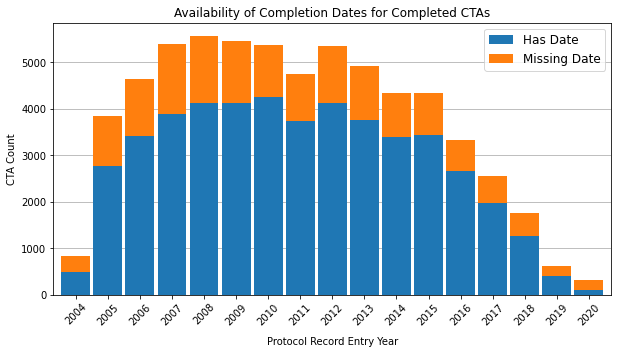

In [63]:
overall_dates = stacked_dates.droplevel(level=0).groupby(stacked_dates.droplevel(level=0).index).sum()

title='Availability of Completion Dates for Completed CTAs'

fig, ax = plt.subplots(figsize = (10,5))
overall_dates.reindex(['numerator', 'missing_dates']).T.plot.bar(stacked=True, width=.9, ax=ax, legend=False, 
                                                                 rot=45, title=title)

ax.set_axisbelow(True)
ax.grid(axis='y', zorder=0)
ax.set_xlabel('Protocol Record Entry Year', labelpad=10)
ax.set_ylabel('CTA Count')

plt.legend(['Has Date', 'Missing Date'], 
           loc='upper right', fontsize=12)
plt.show()
#fig.savefig(parent + '/data/Figures/sfig4.jpg', bbox_inches='tight', dpi=300)

In [79]:
overall_comp_dict = {}

for x in ordered_countries:
    d = stacked_dates.loc[x].T.loc[2004:2016]
    num = d.numerator.sum()
    denom = num + d.missing_dates.sum()
    overall_comp_dict[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_compdate = pd.Series(overall_comp_dict).sort_values(ascending=False)
#rankings_compdate

UK - MHRA 7314.0 7519.0 0.9727357361351243 

Spain - AEMPS 2073.0 3919.0 0.5289614697626945 

Germany - BfArM 5687.0 6265.0 0.9077414205905826 

Italy - AIFA 2400.0 4836.0 0.49627791563275436 

France - ANSM 1122.0 1528.0 0.7342931937172775 

Belgium - FAMHP 1731.0 3575.0 0.4841958041958042 

Netherlands - CCMO 963.0 2353.0 0.40926476838079046 

Hungary - OGYEI 2453.0 2856.0 0.8588935574229691 

Czech Republic - SUKL 2464.0 3024.0 0.8148148148148148 

Austria - BASG 2493.0 2955.0 0.8436548223350254 

Denmark - DKMA 2175.0 2685.0 0.8100558659217877 

Sweden - MPA 1936.0 2518.0 0.7688641779189833 

Poland - URPL 1610.0 1728.0 0.9317129629629629 

Germany - PEI 1305.0 1974.0 0.6610942249240122 

Finland - FIMEA 1241.0 1628.0 0.7622850122850123 

Bulgaria - BDA 1102.0 1279.0 0.8616106333072713 

Greece - EOF 910.0 1058.0 0.8601134215500945 

Slovakia - SUKL 1056.0 1336.0 0.7904191616766467 

Portugal - INFARMED 866.0 984.0 0.8800813008130082 

Lithuania - VVKT 842.0 981.0 0.858307849133537

In [ ]:
fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4)
fig.suptitle("Available Completion Dates for Completed CTAs by NCA", y=1.02, fontsize=23)
fig.tight_layout()

for x, y in enumerate(fig.axes):
    stacked_dates.loc[[rankings_compdate.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.85, 
                                                                            legend=False, sharex='col', rot=45)

    y.set_title(rankings_compdate.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')
    
fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)
    
plt.legend(['Has Date', 'Missing Date'], 
           loc='lower center', ncol=5, bbox_to_anchor = (-1.25, -.9), fontsize=15)

plt.show()
#fig.savefig(parent + '/data/Figures/fig6.jpg', bbox_inches='tight', dpi=300)

# Trend in Results Availability by registration year

In [65]:
reporting_by_country = analysis_df[['eudract_number', 'nca', 'entered_year', 
                                    'approved_year', 'trial_results']].reset_index(drop=True)

reporting_by_country['results_dummy'] = np.where(reporting_by_country.trial_results == 'View results', 1, 0)

In [66]:
trial_reporting = reporting_by_country[['eudract_number', 'results_dummy']].groupby('eudract_number').sum()
trial_reporting = trial_reporting.join(reporting_by_country.groupby('eudract_number').count()[['nca']])
trial_reporting = trial_reporting.join(reporting_by_country[['eudract_number', 'entered_year']].groupby('eudract_number').max()[['entered_year']])
trial_reporting['results_dummy'] = np.where(trial_reporting.results_dummy > 0, 1, 0)

In [67]:
single_cta = trial_reporting[trial_reporting.nca == 1][['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
single_cta['reporting_prct'] = round((single_cta.results_dummy['sum'] / single_cta.results_dummy['count']) * 100, 2)

In [68]:
multi_cta = trial_reporting[trial_reporting.nca > 1][['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
multi_cta['reporting_prct'] = round((multi_cta.results_dummy['sum'] / multi_cta.results_dummy['count']) * 100, 2)

In [69]:
all_trial_reporting = trial_reporting[['entered_year', 'results_dummy']].groupby('entered_year').agg(['sum', 'count'])
all_trial_reporting['reporting_prct'] = round((all_trial_reporting.results_dummy['sum'] / all_trial_reporting.results_dummy['count']) * 100, 2)

In [70]:
print(len(trial_reporting[trial_reporting.nca == 1]))
print(len(trial_reporting[trial_reporting.nca > 1]))
print(len(trial_reporting))

23623
13897
37520


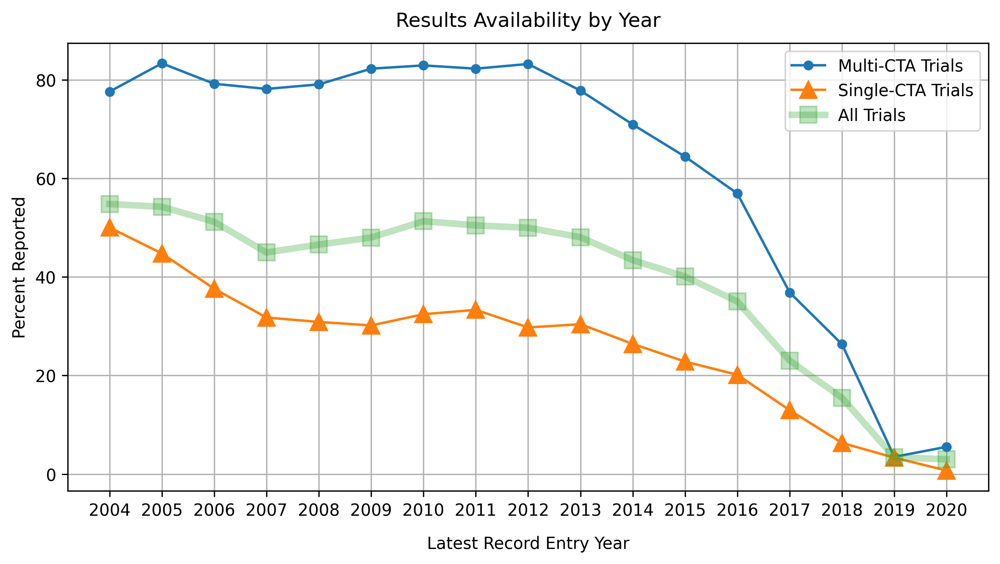

In [71]:
#Graphing the overall trend for single vs multiple CTA trials

fig, ax = plt.subplots(figsize = (10,5), dpi=300)

plt.plot(range(2004,2021), multi_cta['reporting_prct'], marker='.', markersize=10)
plt.plot(range(2004,2021), single_cta['reporting_prct'], marker='^', markersize=10)
plt.plot(range(2004,2021), all_trial_reporting['reporting_prct'], marker='s', markersize=10, lw=4, alpha=.3)

ax.set_xticks(range(2004,2021))

ax.legend(['Multi-CTA Trials', 'Single-CTA Trials', 'All Trials'], loc='upper right', fontsize=10)
ax.set_axisbelow(True)
ax.grid(zorder=0)

plt.ylabel('Percent Reported')
plt.xlabel('Latest Record Entry Year', labelpad=10)

plt.title('Results Availability by Year', pad=10)

plt.show()
#fig.savefig(parent + '/data/Figures/fig7.jpg', bbox_inches='tight', dpi=300)

In [72]:
eu_protocol_count= reporting_by_country.groupby('eudract_number').count()[['nca']].reset_index()

eu_protocol_count.columns = ['eudract_number', 'nca_count']

Creating data for trials with only a single CTA

In [73]:
solo_merge = reporting_by_country.merge(eu_protocol_count, how='left', on='eudract_number')

total = solo_merge[solo_merge.nca_count == 1][['nca', 'entered_year', 'results_dummy']].groupby(['nca', 'entered_year']).count().rename({'results_dummy': 'denominator'}, axis=1)

reported = solo_merge[solo_merge.nca_count == 1][['nca', 'entered_year', 'results_dummy']].groupby(['nca', 'entered_year']).sum().rename({'results_dummy': 'numerator'}, axis=1)

merged = total.join(reported)
merged['unreported'] = merged.denominator - merged.numerator

stacked = merged.drop('denominator', axis=1).stack().unstack(1)

Creating data for trials with multiple CTAs

In [75]:
multi_set = solo_merge[solo_merge.nca_count > 1][['eudract_number', 'results_dummy', 'entered_year']].drop_duplicates()

multi_group = multi_set.groupby('eudract_number', as_index=False).agg('min')[['entered_year', 'results_dummy']].groupby('entered_year').agg({'results_dummy':['count', 'sum']})['results_dummy']
multi_group['prct'] = round((multi_group['sum'] / multi_group['count']) * 100, 2)

Creating for all CTAs

In [80]:
single_cta_reporting = {}

for x in ordered_countries:
    d_r = stacked.loc[x].T.loc[2004:2016]
    num = d_r.numerator.sum()
    denom = num + d_r.unreported.sum()
    single_cta_reporting[x] = num / denom
    print(x, num, denom, num/denom, '\n')

rankings_reporting = pd.Series(single_cta_reporting).sort_values(ascending=False)
rankings_reporting

UK - MHRA 2085.0 3250.0 0.6415384615384615 

Spain - AEMPS 368.0 1956.0 0.18813905930470348 

Germany - BfArM 974.0 2267.0 0.42964269960299956 

Italy - AIFA 431.0 2581.0 0.16698953893839596 

France - ANSM 258.0 1494.0 0.17269076305220885 

Belgium - FAMHP 207.0 835.0 0.24790419161676647 

Netherlands - CCMO 147.0 1540.0 0.09545454545454546 

Hungary - OGYEI 115.0 235.0 0.48936170212765956 

Czech Republic - SUKL 98.0 253.0 0.38735177865612647 

Austria - BASG 214.0 816.0 0.2622549019607843 

Denmark - DKMA 215.0 1029.0 0.20894071914480078 

Sweden - MPA 151.0 785.0 0.19235668789808918 

Poland - URPL 57.0 107.0 0.5327102803738317 

Germany - PEI 271.0 544.0 0.49816176470588236 

Finland - FIMEA 97.0 527.0 0.1840607210626186 

Bulgaria - BDA 66.0 104.0 0.6346153846153846 

Greece - EOF 33.0 111.0 0.2972972972972973 

Slovakia - SUKL 37.0 64.0 0.578125 

Portugal - INFARMED 18.0 48.0 0.375 

Lithuania - VVKT 24.0 50.0 0.48 

Ireland - HPRA 40.0 158.0 0.25316455696202533 

Latvia - ZVA 

Latvia - ZVA             0.729730
Romania - ANMDM          0.681818
UK - MHRA                0.641538
Bulgaria - BDA           0.634615
Slovakia - SUKL          0.578125
Poland - URPL            0.532710
Croatia - MIZ            0.500000
Germany - PEI            0.498162
Hungary - OGYEI          0.489362
Lithuania - VVKT         0.480000
Estonia - SAM            0.441860
Germany - BfArM          0.429643
Czech Republic - SUKL    0.387352
Portugal - INFARMED      0.375000
Slovenia - JAZMP         0.333333
Greece - EOF             0.297297
Austria - BASG           0.262255
Ireland - HPRA           0.253165
Belgium - FAMHP          0.247904
Denmark - DKMA           0.208941
Sweden - MPA             0.192357
Iceland - IMA            0.189189
Spain - AEMPS            0.188139
Finland - FIMEA          0.184061
France - ANSM            0.172691
Italy - AIFA             0.166990
Netherlands - CCMO       0.095455
Norway - NoMA            0.060606
dtype: float64

# Single CTAs for all NCAs...could turn this into lines as well potentially

fig, axes = plt.subplots(figsize = (20, 16), nrows=7, ncols=4)
fig.suptitle("Proportion of Single-CTA Trials Reported by Year", y=1.02, fontsize=23)
fig.tight_layout()
for x, y in enumerate(fig.axes):
    stacked.loc[[rankings_reporting.index[x]]].droplevel(level=0).T.plot.bar(stacked=True, ax=y, width=.9, legend=False,
                                                                        sharex='col', rot=45)
    
    y.set_title(rankings_reporting.index[x], pad=6, fontsize=16)
    y.set_axisbelow(True)
    y.grid(axis='y', zorder=0)
    y.set_xlabel('')

plt.legend(['Reported', 'Unreported'], 
           loc='lower center', ncol=5, bbox_to_anchor = (-1.25, -.9), fontsize=15)

fig.text(-0.015, 0.5, 'Trial Count', ha='center', va='center', rotation='vertical', fontsize=20)
fig.text(.5, -0.02, 'Record Entry Year', ha='center', va='center', fontsize=20)

plt.show()
#fig.savefig(parent + '/data/Figures/fig8.jpg', bbox_inches='tight', dpi=300)